In [1]:
import torch
import numpy as np
import time
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [2]:
sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
device = torch.device("cuda")
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)
predictor.model.to(device)

DEVICE = "cuda"
DUMMY_IMAGE = torch.randn(1, 3, 1024, 1024).to(DEVICE)
# Dummy points: 1 point, batch size 1
DUMMY_POINT_COORDS = torch.randint(0, 1024, (1, 1, 2)).float().to(DEVICE)
DUMMY_POINT_LABELS = torch.randint(0, 1, (1, 1)).float().to(DEVICE)

In [3]:
img = np.zeros((1024, 1024, 3), dtype=np.uint8)
predictor.set_image(img)

In [4]:
backbone_out = predictor.model.forward_image(DUMMY_IMAGE)
 
print("Backbone output shapes:", backbone_out.keys())
backbone_out['vision_features'].shape

Backbone output shapes: dict_keys(['vision_features', 'vision_pos_enc', 'backbone_fpn'])


torch.Size([1, 256, 64, 64])

In [13]:
predictor.model.num_feature_levels

3

In [8]:
len(backbone_out['backbone_fpn']), [feat.shape for feat in backbone_out['backbone_fpn']]

(3,
 [torch.Size([1, 32, 256, 256]),
  torch.Size([1, 64, 128, 128]),
  torch.Size([1, 256, 64, 64])])

In [7]:
predictor._features["image_embed"][-1].unsqueeze(0).shape

torch.Size([1, 256, 64, 64])

In [11]:
len(predictor._features['high_res_feats']), [feat.shape for feat in predictor._features['high_res_feats']]

(2, [torch.Size([1, 32, 256, 256]), torch.Size([1, 64, 128, 128])])

In [ ]:
import torch.nn as nn
from torch.export import Dim

# --- PART A: EXPORT IMAGE ENCODER ---

class EncoderWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model.image_encoder


    def forward(self, x):
        out = self.model(x)
        return out["vision_features"], out["backbone_fpn"][0], out["backbone_fpn"][1]


# --- PART B: EXPORT MASK DECODER ---
# The decoder takes the features + prompts.
# We must allow dynamic axes for 'point_coords' and 'point_labels'

class DecoderWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model.sam_mask_decoder
        self.pe_layer = model.sam_prompt_encoder

    def forward(self, image_embed, 
                high_res_0, 
                high_res_1, 
                concat_points,
                multimask_output,
                batched_mode,
        ):
        # 1. Prepare Features List
        high_res_features = [self.model.conv_s0(high_res_0), self.model.conv_s1(high_res_1)]
        
        # 2. Embed Prompts
        sparse_embeddings, dense_embeddings = self.pe_layer(
            points=concat_points,
            boxes=None,
            masks=None,
        )

        # 3. Run Decoder
        low_res_masks, iou_predictions, _, _ = self.model(
            image_embeddings=image_embed,
            image_pe=self.pe_layer.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=multimask_output,
            repeat_image=batched_mode, # Standard inference mode
            high_res_features=high_res_features
        )
        return low_res_masks, iou_predictions

In [16]:
timg = sam2enc.transforms(image)
timg.shape

torch.Size([3, 1024, 1024])

In [18]:
from PIL import Image
image = Image.open('images/handme_Color.png')
image = np.array(image.convert("RGB"))
sam2enc = EncoderWrapper(sam2_model,DEVICE)
img_features, high_res_0, high_res_1 = sam2enc(image)
img_features.shape, high_res_0.shape, high_res_1.shape

(torch.Size([1, 256, 64, 64]),
 torch.Size([1, 256, 256, 256]),
 torch.Size([1, 256, 128, 128]))

In [19]:
sam2dec = DecoderWrapper(sam2_model)
low_res_masks, iou_preds = sam2dec(img_features, high_res_0, high_res_1, DUMMY_POINT_COORDS, DUMMY_POINT_LABELS)
low_res_masks.shape, iou_preds.shape

(torch.Size([1, 3, 256, 256]), torch.Size([1, 3]))

In [ ]:
from torch.export import Dim
from sam2onnx import EncoderWrapper, DecoderWrapper

OPSET = 18  # SAM 2 requires a high opset (16 or 17) for modern operators

dummy_img = torch.randn(1, 3, 1024, 1024).to(DEVICE)
# Dummy Inputs for Decoder
embed_dim = 256
dummy_embed = torch.randn(1, 256, 64, 64).to(DEVICE)
dummy_feat_0 = torch.randn(1, 32, 256, 256).to(DEVICE) # Hiera-Large specific shape, might vary for Tiny/Base
dummy_feat_1 = torch.randn(1, 64, 128, 128).to(DEVICE)

# Dummy Point: 1 point per image. Shape: (Batch, Num_Points, 2)
dummy_coords = torch.randint(0, 1024, (1, 1, 2), dtype=torch.float32).to(DEVICE)
dummy_labels = torch.randint(0, 1, (1, 1), dtype=torch.int32).to(DEVICE)
# Define the dynamic dimension
num_points = Dim("num_points", min=1)

# CORRECTED dictionary: Includes ALL input arguments
# Map static inputs to None, and dynamic inputs to their Dim specs
dynamic_shapes = {
    "image_embed": None,   # Static
    "high_res_0": None,    # Static
    "high_res_1": None,    # Static
    "point_coords": {1: num_points},  # Dynamic dim 1
    "point_labels": {1: num_points},  # Dynamic dim 1
    
}

print("Exporting Encoder...")
torch.onnx.export(
    EncoderWrapper(sam2_model),
    dummy_img,
    "sam2_encoder.onnx",
    input_names=["image"],
    output_names=["image_embed", "high_res_feat_0", "high_res_feat_1"],
    opset_version=OPSET,
    do_constant_folding=True
)
print("Encoder exported successfully!")
print("Exporting Decoder with corrected dynamic_shapes...")

torch.onnx.export(
    DecoderWrapper(sam2_model),
    # Tuple of inputs matching the keys above
    (dummy_embed, dummy_feat_0, dummy_feat_1, dummy_coords, dummy_labels),
    "sam2_decoder.onnx",
    input_names=["image_embed", "high_res_feat_0", "high_res_feat_1",                 
                 "concat_points", "multimask_output", "batched_mode"],
    output_names=["masks", "iou_predictions"],
    opset_version=OPSET,
    dynamic_shapes=dynamic_shapes  # <--- Now valid
)

print("Decoder exported successfully!")

print("Done! Models saved as sam2_encoder.onnx and sam2_decoder.onnx")

Exporting Encoder...
[torch.onnx] Obtain model graph for `EncoderWrapper([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `EncoderWrapper([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decomposition...
[torch.onnx] Run decomposition... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅


W1219 13:07:45.818000 24307 torch/onnx/_internal/exporter/_compat.py:114] Setting ONNX exporter to use operator set version 18 because the requested opset_version 17 is a lower version than we have implementations for. Automatic version conversion will be performed, which may not be successful at converting to the requested version. If version conversion is unsuccessful, the opset version of the exported model will be kept at 18. Please consider setting opset_version >=18 to leverage latest ONNX features


Encoder exported successfully!
Exporting Decoder with corrected dynamic_shapes...
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=False)`... ❌
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=True)`...
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=True)`... ❌


TorchExportError: Failed to export the model with torch.export. [96mThis is step 1/3[0m of exporting the model to ONNX. Next steps:
- Modify the model code for `torch.export.export` to succeed. Refer to https://pytorch.org/docs/stable/generated/exportdb/index.html for more information.
- Debug `torch.export.export` and submit a PR to PyTorch.
- Create an issue in the PyTorch GitHub repository against the [96m*torch.export*[0m component and attach the full error stack as well as reproduction scripts.

## Exception summary

<class 'TypeError'>: missing a required argument: 'batched_mode'

(Refer to the full stack trace above for more information.)

In [4]:
import onnxruntime as ort

print("Available Providers:")
print(ort.get_available_providers())

print(f"\nDevice: {ort.get_device()}")

Available Providers:
['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']

Device: GPU


In [ ]:
import onnxruntime as ort
import numpy as np
import cv2

# 1. Load Sessions
# Use "CUDAExecutionProvider" for GPU, "CPUExecutionProvider" for CPU
providers = ["CUDAExecutionProvider"]
encoder_session = ort.InferenceSession("sam2_encoder.onnx", providers=providers)
decoder_session = ort.InferenceSession("sam2_decoder.onnx", providers=providers)

# 2. Preprocess Image
image = cv2.imread("images/handme_Color.png")
image = cv2.resize(image, (1024, 1024))
# Normalize: (H, W, C) -> (1, 3, H, W) and standard SAM normalization
# Note: Add standard mean/std normalization here if strictly required
inputs = image.astype(np.float32).transpose(2, 0, 1)[None, :, :, :] 

# 3. Run Encoder (Run Once)
enc_outputs = encoder_session.run(None, {"image": inputs})
image_embed = enc_outputs[0]
high_res_0 = enc_outputs[1]
high_res_1 = enc_outputs[2]

# 4. Prepare Prompts (Run Many Times)
# Example: 2 points. Note shapes: (Batch, Num_Points, 2)
points = np.array([[[300, 275], [600,50]]], dtype=np.float32)
labels = np.array([[1, 0]], dtype=np.int32) # 1 = foreground

# 5. Run Decoder
decoder_inputs = {
    "image_embed": image_embed,
    "high_res_feat_0": high_res_0,
    "high_res_feat_1": high_res_1,
    "point_coords": points,
    "point_labels": labels,
    "multimask_output": np.array([[1]], dtype=np.int32),  # True
    "batched_mode": np.array([[0]], dtype=np.int32),      # False
}

masks, iou_scores = decoder_session.run(None, decoder_inputs)

print(f"Masks shape: {masks.shape}") # Should be (1, 3, 1024, 1024)

2025-12-19 14:40:34.580163539 [W:onnxruntime:, session_state.cc:1316 VerifyEachNodeIsAssignedToAnEp] Some nodes were not assigned to the preferred execution providers which may or may not have an negative impact on performance. e.g. ORT explicitly assigns shape related ops to CPU to improve perf.
2025-12-19 14:40:34.580193720 [W:onnxruntime:, session_state.cc:1318 VerifyEachNodeIsAssignedToAnEp] Rerunning with verbose output on a non-minimal build will show node assignments.


InvalidArgument: [ONNXRuntimeError] : 2 : INVALID_ARGUMENT : Invalid input name: multimask_output

In [19]:
from sam2.utils.transforms import SAM2Transforms

_transforms = SAM2Transforms(
            resolution=1024,
            mask_threshold=0.0,
            max_hole_area=0.0,
            max_sprinkle_area=0.0,
        )

In [20]:
masks_gpu = torch.from_numpy(masks).cuda()
masks_gpu.shape

torch.Size([1, 1, 256, 256])

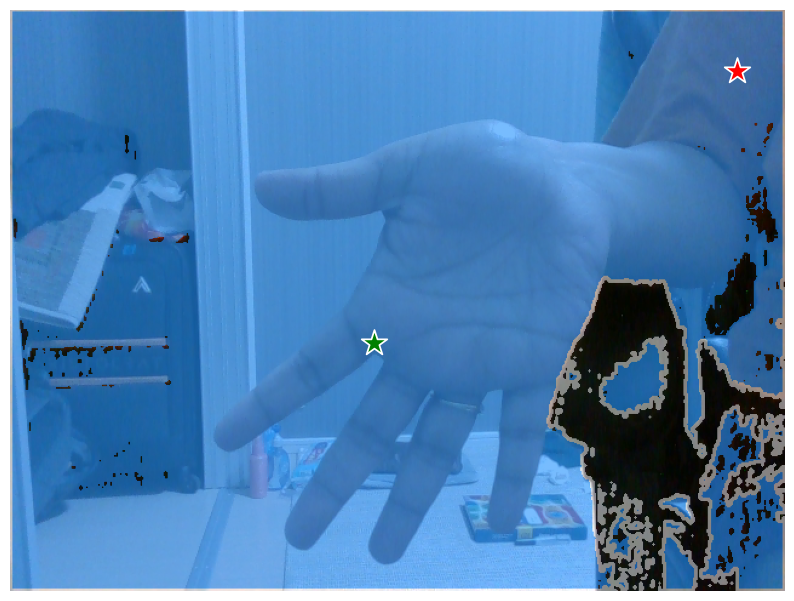

In [21]:
from PIL import Image
import torch
from display_utils import show_masks
image = Image.open('images/handme_Color.png')
image = np.array(image.convert("RGB"))
masks1 = _transforms.postprocess_masks(masks_gpu, image.shape[:2])
masks1 = masks1 > 0.0
masks_np = masks1.squeeze(0).float().detach().cpu().numpy()
show_masks(image, masks_np, iou_scores, point_coords=points, box_coords=None, input_labels=labels, borders=True)

error: OpenCV(4.12.0) /io/opencv/modules/imgproc/src/contours_new.cpp:332: error: (-2:Unspecified error) in function 'static std::shared_ptr<ContourScanner_> ContourScanner_::create(cv::ContourDataStorage<cv::Point_<int>, 1024, 0>::storage_t&, cv::ContourDataStorage<signed char, 1024, 0>::storage_t&, cv::Mat, int, int, cv::Point)'
> Modes other than RETR_FLOODFILL and RETR_CCOMP support only CV_8UC1 images (expected: 'img.type() == CV_8UC1'), where
>     'img.type()' is 2040 (CV_8UC256)
> must be equal to
>     'CV_8UC1' is 0 (CV_8UC1)


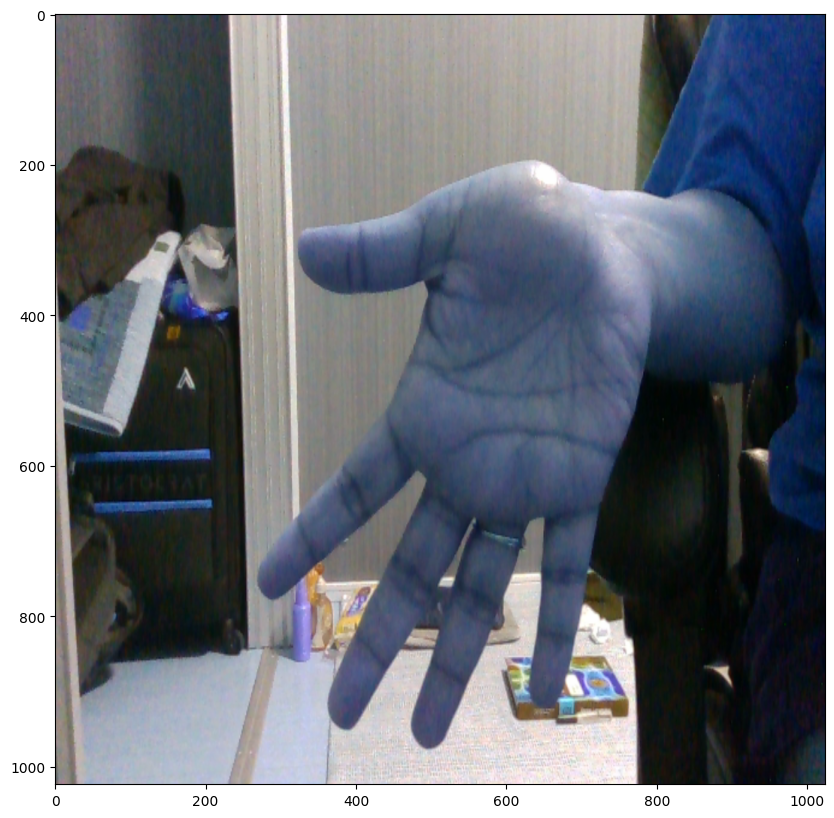

In [ ]:

image = cv2.imread("images/handme_Color.png")
image = cv2.resize(image, (1024, 1024), interpolation=cv2.INTER_LINEAR)
show_masks(image.astype(np.uint8), masks, iou_scores, point_coords=points, box_coords=None, input_labels=labels, borders=True)

In [9]:
img_features.shape, high_res_0.shape, high_res_1.shape

(torch.Size([1, 256, 64, 64]),
 torch.Size([1, 256, 256, 256]),
 torch.Size([1, 256, 128, 128]))

In [ ]:
from torch.export import Dim
from sam2onnx import EncoderWrapper, DecoderWrapper

num_points = Dim("num_points", min=1)

# DYNAMIC SHAPES CONFIG
# We use the shapes from the real run above, so they are guaranteed correct.
dynamic_shapes = {
    "image_embed": None,
    "high_res_0": None,
    "high_res_1": None,
    "point_coords": {1: num_points},
    "point_labels": {1: num_points},
}

print("Exporting Decoder...")
# KEY FIX: Pass the 'real_' tensors we generated earlier as the dummy inputs
torch.onnx.export(
    DecoderWrapper(predictor.model),
    (img_features, high_res_0, high_res_1, DUMMY_POINT_COORDS, DUMMY_POINT_LABELS),
    "sam2_decoder.onnx",
    input_names=["image_embed", "high_res_feat_0", "high_res_feat_1", "point_coords", "point_labels"],
    output_names=["masks", "iou_predictions"],
    opset_version=OPSET,
    dynamic_shapes=dynamic_shapes
)

print("Done! Models re-exported with correct large-model shapes.")

Exporting Decoder...
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `DecoderWrapper([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decomposition...
[torch.onnx] Run decomposition... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅


/home/manoj/.local/lib/python3.10/site-packages/torch/onnx/_internal/exporter/_dynamic_shapes.py:264: UserWarning: # The axis name: num_points will not be used, since it shares the same shape constraints with another axis: num_points.
  warnings.warn(


Applied 8 of general pattern rewrite rules.
Applied 2 of general pattern rewrite rules.
Done! Models re-exported with correct large-model shapes.


In [49]:

import onnxruntime as ort

# Dummy Data
IMAGE_SIZE = 1024
input_image = np.random.randint(0, 255, (IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.uint8)
# Preprocessed input for ONNX (Standard SAM normalization expected)
onnx_input_img = input_image.astype(np.float32).transpose(2, 0, 1)[None, :, :, :] / 255.0

# Dummy Prompts (1 point)
point_coords = np.array([[[500, 500]]], dtype=np.float32)
point_labels = np.array([[1]], dtype=np.float32)

print(f"Benchmarking on: {DEVICE.upper()}")
print("-" * 60)


# ==========================================
# 2. LOAD ONNX MODELS
# ==========================================
print("Loading ONNX Models...")

import onnxruntime as ort

# Configuration for TensorRT
# We enable FP16 for speed and caching to avoid re-compiling every time you restart the script.
trt_options = {
    'trt_fp16_enable': True,     # CRITICAL: Enables FP16 precision (2x-3x faster)
    'trt_max_workspace_size': 8 * 1024 * 1024 * 1024, # 8GB allocation workspace
    'trt_engine_cache_enable': True,
    'trt_engine_cache_path': "./trt_cache", # Compile once, load fast next time
}

print("Loading TensorRT Engines...")
print("(Note: First run will be slow while TRT compiles the model!)")

# Load Sessions

# Now run your benchmark code as usual...

providers = [  ("CUDAExecutionProvider", {"device_id": 0})]
enc_sess = ort.InferenceSession("sam2_encoder.onnx", providers=providers)
dec_sess = ort.InferenceSession("sam2_decoder.onnx", providers=providers)

# ==========================================
# 3. DEFINE RUN FUNCTIONS
# ==========================================

def run_pytorch_encoder():
    with torch.inference_mode():
        predictor.set_image(input_image)
    torch.cuda.synchronize()

def run_pytorch_decoder():
    with torch.inference_mode():
        predictor.predict(
            point_coords=point_coords[0],
            point_labels=point_labels[0],
            multimask_output=True
        )
    torch.cuda.synchronize()

def run_onnx_encoder():
    # Returns: image_embed, high_res_0, high_res_1
    return enc_sess.run(None, {"image": onnx_input_img})

# Cache encoder output for decoder testing
enc_outs = run_onnx_encoder() 
onnx_feats = {
    "image_embed": enc_outs[0],
    "high_res_feat_0": enc_outs[1],
    "high_res_feat_1": enc_outs[2],
    "point_coords": point_coords,
    "point_labels": point_labels
}

def run_onnx_decoder():
    dec_sess.run(None, onnx_feats)

# ==========================================
# 4. BENCHMARK UTILITY
# ==========================================

def benchmark(name, func, iterations=50):
    # Warmup
    for _ in range(10):
        func()
    
    # Timing
    start = time.time()
    for _ in range(iterations):
        func()
    end = time.time()
    
    avg_time = (end - start) / iterations * 1000 # ms
    fps = 1000 / avg_time
    print(f"{name: <25} | {avg_time:6.2f} ms | {fps:6.1f} FPS")
    return avg_time

# ==========================================
# 5. RUN TESTS
# ==========================================

print("-" * 60)
print(f"{'Component': <25} | {'Latency': <9} | {'Throughput'}")
print("-" * 60)

# Encoder Comparison
pt_enc_time = benchmark("PyTorch Encoder", run_pytorch_encoder, iterations=20)
onnx_enc_time = benchmark("ONNX Encoder", run_onnx_encoder, iterations=20)

# Decoder Comparison
pt_dec_time = benchmark("PyTorch Decoder", run_pytorch_decoder, iterations=100)
onnx_dec_time = benchmark("ONNX Decoder", run_onnx_decoder, iterations=100)

print("-" * 60)
print("SPEEDUP REPORT:")
print(f"Encoder Speedup: {pt_enc_time / onnx_enc_time:.2f}x")
print(f"Decoder Speedup: {pt_dec_time / onnx_dec_time:.2f}x")
print("-" * 60)

Benchmarking on: CUDA
------------------------------------------------------------
Loading ONNX Models...
Loading TensorRT Engines...
(Note: First run will be slow while TRT compiles the model!)


2025-12-12 17:02:12.138452045 [W:onnxruntime:, session_state.cc:1316 VerifyEachNodeIsAssignedToAnEp] Some nodes were not assigned to the preferred execution providers which may or may not have an negative impact on performance. e.g. ORT explicitly assigns shape related ops to CPU to improve perf.
2025-12-12 17:02:12.138479045 [W:onnxruntime:, session_state.cc:1318 VerifyEachNodeIsAssignedToAnEp] Rerunning with verbose output on a non-minimal build will show node assignments.


------------------------------------------------------------
Component                 | Latency   | Throughput
------------------------------------------------------------
PyTorch Encoder           | 125.69 ms |    8.0 FPS
ONNX Encoder              | 142.76 ms |    7.0 FPS
PyTorch Decoder           |   4.65 ms |  215.2 FPS
ONNX Decoder              |   3.48 ms |  287.1 FPS
------------------------------------------------------------
SPEEDUP REPORT:
Encoder Speedup: 0.88x
Decoder Speedup: 1.33x
------------------------------------------------------------


In [7]:
try:
    import tensorrt as trt
    print(f"✅ TensorRT Library: Found (Version {trt.__version__})")
except ImportError as e:
    print("❌ TensorRT Import Failed.")
    print(f"   Error: {e}")
    print("   Fix: Try 'pip install tensorrt' or check LD_LIBRARY_PATH.")
    exit()

print("\n--- TensorRT Compatibility Test ---")
try:
    # 2. Initialize the Logger and Builder
    TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
    builder = trt.Builder(TRT_LOGGER)
    
    # 3. Create a Network definition (simple dummy network)
    network = builder.create_network(1 << int(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH))
    
    # 4. Check if we can create a build configuration
    config = builder.create_builder_config()
    
    # 5. Check if FP16 is supported on this GPU
    if builder.platform_has_fast_fp16:
        print("✅ GPU Hardware: Supports FP16 (Fast)")
    else:
        print("⚠️ GPU Hardware: No native FP16 support (Will run in FP32)")

    print("✅ TensorRT Builder: Success! (Your installation is working)")

except Exception as e:
    print("❌ TensorRT Builder Failed.")
    print(f"   Error: {e}")
    if "libnvinfer.so" in str(e):
        print("\n   [CRITICAL] System cannot find the C++ libraries.")
        print("   See the LD_LIBRARY_PATH fix below.")

✅ TensorRT Library: Found (Version 10.14.1.48.post1)

--- TensorRT Compatibility Test ---
✅ GPU Hardware: Supports FP16 (Fast)
✅ TensorRT Builder: Success! (Your installation is working)


In [10]:
import tensorrt as trt
import os

# --- CONFIGURATION ---
ONNX_PATH = "sam2_encoder.onnx"
ENGINE_PATH = "sam2_encoder.engine"
INPUT_NAME = "image"  # Must match the name used in torch.onnx.export
INPUT_SHAPE = (1, 3, 1024, 1024) # (Batch, Channels, Height, Width)

# 1. Setup Builder
TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
builder = trt.Builder(TRT_LOGGER)
config = builder.create_builder_config()

# Enable FP16 (Crucial for Encoder speed)
if builder.platform_has_fast_fp16:
    print("✅ FP16 Enabled")
    config.set_flag(trt.BuilderFlag.FP16)

# 2. Define Network & Parser
# Explicit Batch flag is required for modern TensorRT
network = builder.create_network(1 << int(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH))
parser = trt.OnnxParser(network, TRT_LOGGER)

# 3. Load ONNX
print(f"Loading {ONNX_PATH}...")
with open(ONNX_PATH, "rb") as model:
    if not parser.parse(model.read()):
        print("❌ Failed to parse ONNX file:")
        for error in range(parser.num_errors):
            print(parser.get_error(error))
        raise RuntimeError("ONNX Parsing Failed")

# 4. Define Optimization Profile (Static Shape)
# Even for static inputs, explicit batch mode often requires a profile.
# We set Min = Opt = Max to the same fixed shape.
profile = builder.create_optimization_profile()
profile.set_shape(INPUT_NAME, INPUT_SHAPE, INPUT_SHAPE, INPUT_SHAPE)
config.add_optimization_profile(profile)

# 5. Build Engine
print("Building TensorRT Engine... (This will take a few minutes)")
try:
    # Note: build_serialized_network is the modern API (TRT 8.5+)
    serialized_engine = builder.build_serialized_network(network, config)
    
    with open(ENGINE_PATH, "wb") as f:
        f.write(serialized_engine)
    print(f"🎉 Success! Engine saved to {ENGINE_PATH}")

except Exception as e:
    print(f"❌ Build Failed: {e}")

✅ FP16 Enabled
[12/12/2025-16:21:32] [TRT] [W] WARNING The logger passed into createInferBuilder differs from one already registered for an existing builder, runtime, or refitter. So the current new logger is ignored, and TensorRT will use the existing one which is returned by nvinfer1::getLogger() instead.
Loading sam2_encoder.onnx...
Building TensorRT Engine... (This will take a few minutes)
🎉 Success! Engine saved to sam2_encoder.engine


In [9]:
import tensorrt as trt
import os

# 1. Setup
TRT_LOGGER = trt.Logger(trt.Logger.WARNING)
builder = trt.Builder(TRT_LOGGER)
config = builder.create_builder_config()

# Enable FP16 if GPU supports it
if builder.platform_has_fast_fp16:
    config.set_flag(trt.BuilderFlag.FP16)

# 2. Define Network & Parser
network = builder.create_network(1 << int(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH))
parser = trt.OnnxParser(network, TRT_LOGGER)

# 3. Load ONNX
onnx_path = "sam2_decoder.onnx"
engine_path = "sam2_decoder.engine"

with open(onnx_path, "rb") as model:
    if not parser.parse(model.read()):
        for error in range(parser.num_errors):
            print(parser.get_error(error))
        raise RuntimeError("Failed to parse ONNX file")

# 4. Define Optimization Profile (CRITICAL for Dynamic Shapes)
profile = builder.create_optimization_profile()

# Inputs: image_embed, high_res_feat_0, high_res_feat_1, point_coords, point_labels
# We must set shapes for ALL inputs.
# Static inputs (Embeddings):
profile.set_shape("image_embed", (1, 256, 64, 64), (1, 256, 64, 64), (1, 256, 64, 64))
profile.set_shape("high_res_feat_0", (1, 32, 256, 256), (1, 32, 256, 256), (1, 32, 256, 256))
profile.set_shape("high_res_feat_1", (1, 64, 128, 128), (1, 64, 128, 128), (1, 64, 128, 128))

# Dynamic inputs (Points):
# (Min, Opt, Max) -> We allow 1 to 10 points
profile.set_shape("point_coords", (1, 1, 2), (1, 3, 2), (1, 10, 2))
profile.set_shape("point_labels", (1, 1), (1, 3), (1, 10))

config.add_optimization_profile(profile)

# 5. Build Engine
print("Building TensorRT Engine... (This may take a few minutes)")
serialized_engine = builder.build_serialized_network(network, config)

with open(engine_path, "wb") as f:
    f.write(serialized_engine)

print(f"Success! Engine saved to {engine_path}")

[12/12/2025-16:20:12] [TRT] [W] WARNING The logger passed into createInferBuilder differs from one already registered for an existing builder, runtime, or refitter. So the current new logger is ignored, and TensorRT will use the existing one which is returned by nvinfer1::getLogger() instead.
Building TensorRT Engine... (This may take a few minutes)
[12/12/2025-16:20:12] [TRT] [W] Detected layernorm nodes in FP16.
[12/12/2025-16:20:12] [TRT] [W] Running layernorm after self-attention with FP16 Reduce or Pow may cause overflow. Forcing Reduce or Pow Layers in FP32 precision, or exporting the model to use INormalizationLayer (available with ONNX opset >= 17) can help preserving accuracy.
Success! Engine saved to sam2_decoder.engine


In [ ]:
import torch
import tensorrt as trt
import time
import numpy as np
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
# --- CONFIGURATION ---
ENCODER_ENGINE = "sam2_encoder.engine"
DECODER_ENGINE = "sam2_decoder.engine"
DEVICE = "cuda"

TRT_LOGGER = trt.Logger(trt.Logger.WARNING)

class TRTWrapperV10:
    def __init__(self, engine_path):
        self.runtime = trt.Runtime(TRT_LOGGER)
        with open(engine_path, "rb") as f:
            self.engine = self.runtime.deserialize_cuda_engine(f.read())
        self.context = self.engine.create_execution_context()
        
        # --- TENSORRT 10 SETUP ---
        self.inputs = []
        self.outputs = []
        
        # Iterate over all IO tensors (New API)
        for i in range(self.engine.num_io_tensors):
            name = self.engine.get_tensor_name(i)
            mode = self.engine.get_tensor_mode(name)
            
            if mode == trt.TensorIOMode.INPUT:
                self.inputs.append(name)
            else:
                self.outputs.append(name)

    def infer(self, feed_dict):
        """
        feed_dict: { "input_name": torch_tensor }
        """
        # 1. Set Input Shapes & Addresses
        for name in self.inputs:
            tensor = feed_dict[name]
            
            # Set dynamic shape (Required before address)
            self.context.set_input_shape(name, tuple(tensor.shape))
            
            # Set memory address (New V3 API)
            self.context.set_tensor_address(name, tensor.data_ptr())

        # 2. Allocate & Set Output Addresses
        output_tensors = {}
        for name in self.outputs:
            # We hardcode known SAM 2 output shapes because inferring them 
            # from the engine before execution is complex in dynamic mode.
            if "masks" in name:
                shape = (1, 3, 1024, 1024)
            elif "iou" in name:
                shape = (1, 3)
            elif "image_embed" in name:
                shape = (1, 256, 64, 64)
            elif "high_res_feat_0" in name:
                shape = (1, 32, 256, 256)
            elif "high_res_feat_1" in name:
                shape = (1, 64, 128, 128)
            else:
                # Fallback safety
                shape = (1, 256, 64, 64)

            tensor = torch.empty(shape, device=DEVICE, dtype=torch.float32)
            self.context.set_tensor_address(name, tensor.data_ptr())
            output_tensors[name] = tensor

        # 3. Execute (V3 API)
        # Note: No binding list passed here; state is stored in context
        self.context.execute_async_v3(torch.cuda.current_stream().cuda_stream)
        
        return output_tensors

# ==========================================
# SETUP & RUN
# ==========================================
print("Loading Engines (TensorRT 10 Native)...")
encoder = TRTWrapperV10(ENCODER_ENGINE)
decoder = TRTWrapperV10(DECODER_ENGINE)

# Dummy Data
print("Preparing Data...")
dummy_img = torch.randn(1, 3, 1024, 1024, device=DEVICE, dtype=torch.float32)
point_coords = torch.randint(0, 1024, (1, 3, 2), device=DEVICE)
point_labels = torch.randint(0, 1, (1, 3), device=DEVICE, dtype=torch.int32)

# Warmup Encoder
print("Warmup Encoder...")
enc_out = encoder.infer({"image": dummy_img})

# # Extract features for Decoder
# image_embed = enc_out["image_embed"]
# high_res_0 = enc_out["high_res_feat_0"]
# high_res_1 = enc_out["high_res_feat_1"]

# decoder_inputs = {
#     "image_embed": image_embed,
#     "high_res_feat_0": high_res_0,
#     "high_res_feat_1": high_res_1,
#     "point_coords": point_coords,
#     "point_labels": point_labels
# }

# # ==========================================
# BENCHMARK
# ==========================================
def benchmark(name, func, args, iterations=100):
    # Warmup
    for _ in range(10):
        func(args)
    torch.cuda.synchronize()
    
    start = torch.cuda.Event(enable_timing=True)
    end = torch.cuda.Event(enable_timing=True)
    
    start.record()
    for _ in range(iterations):
        func(args)
    end.record()
    
    torch.cuda.synchronize()
    avg_time = start.elapsed_time(end) / iterations
    fps = 1000 / avg_time
    
    print(f"{name: <25} | {avg_time:6.2f} ms | {fps:6.1f} FPS")

# print("-" * 60)
# print(f"{'Engine': <25} | {'Latency': <9} | {'Throughput'}")
# print("-" * 60)

# benchmark("TensorRT Encoder", encoder.infer, {"image": dummy_img}, iterations=50)
# benchmark("TensorRT Decoder", decoder.infer, decoder_inputs, iterations=200)
# print("-" * 60)

Loading Engines (TensorRT 10 Native)...
Preparing Data...
Warmup Encoder...
[12/19/2025-15:30:31] [TRT] [W] Using default stream in enqueueV3() may lead to performance issues due to additional calls to cudaStreamSynchronize() by TensorRT to ensure correct synchronization. Please use non-default stream instead.
[12/19/2025-15:30:31] [TRT] [E] IExecutionContext::enqueueV3: Error Code 1: Cask (Cask convolution execution In execute at /_src/runtime/gpu/cask/convBaseRunner.cpp:312)


In [2]:
dec_out = decoder.infer({"image_embed": enc_out["image_embed"],
                         "high_res_feat_0": enc_out["high_res_feat_0"],
                         "high_res_feat_1": enc_out["high_res_feat_1"],
                         "point_coords": point_coords,
                         "point_labels": point_labels
                        })

[12/19/2025-15:30:33] [TRT] [E] IExecutionContext::setInputShape: Error Code 3: API Usage Error (Parameter check failed, condition: engineDims.d[i] == dims.d[i]. Static dimension mismatch while setting input shape for high_res_feat_0. Set dimensions are [1,32,256,256]. Expected dimensions are [1,256,256,256]. In setInputShape at /_src/runtime/api/executionContext.cpp:2364)
[12/19/2025-15:30:33] [TRT] [E] IExecutionContext::setInputShape: Error Code 3: API Usage Error (Parameter check failed, condition: engineDims.d[i] == dims.d[i]. Static dimension mismatch while setting input shape for high_res_feat_1. Set dimensions are [1,64,128,128]. Expected dimensions are [1,256,128,128]. In setInputShape at /_src/runtime/api/executionContext.cpp:2364)


AcceleratorError: CUDA error: an illegal memory access was encountered
Search for `cudaErrorIllegalAddress' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [2]:
import torch
DEVICE = "cuda"
torch.randint(0, 1024, (1, 3, 2), device=DEVICE)

tensor([[[337, 836],
         [185, 837],
         [341, 569]]], device='cuda:0')

In [4]:
dummy_img.shape, point_coords.shape, point_labels.shape

(torch.Size([1, 3, 1024, 1024]), torch.Size([1, 3, 2]), torch.Size([1, 3]))

In [ ]:
import torch.nn.functional as F
def prepare_inputs(img, coords, labels, target_size=(1024, 1024)):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    
    # --- Image Conversion ---
    # Numpy (H, W, C) -> Tensor (C, H, W)
    img_tensor = torch.from_numpy(img).float().permute(2, 0, 1)
    
    # Add Batch Dim: (1, C, H, W)
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    # Resize to 1024x1024
    # SAM 2 usually expects 1024x1024 inputs.
    img_tensor = F.interpolate(
        img_tensor, 
        size=target_size, 
        mode='bilinear', 
        align_corners=False
    )
    
    # --- Coords Conversion ---
    # (N, 2) -> (1, N, 2)
    coords_tensor = torch.from_numpy(coords).float().unsqueeze(0).to(device)
    
    # IMPORTANT: If you resize the image, you must scale the coordinates!
    # Original Size: 640x480 -> New Size: 1024x1024
    orig_h, orig_w = img.shape[:2]
    scale_x = target_size[1] / orig_w
    scale_y = target_size[0] / orig_h
    
    coords_tensor[..., 0] *= scale_x
    coords_tensor[..., 1] *= scale_y

    # --- Labels Conversion ---
    # (N,) -> (1, N)
    labels_tensor = torch.from_numpy(labels).int().unsqueeze(0).to(device)
    
    return img_tensor, coords_tensor, labels_tensor

# 3. Execute & Verify


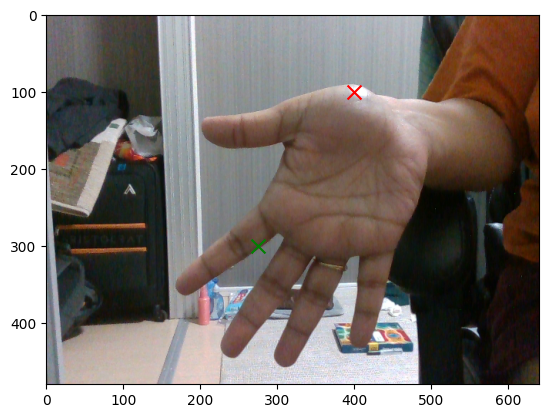

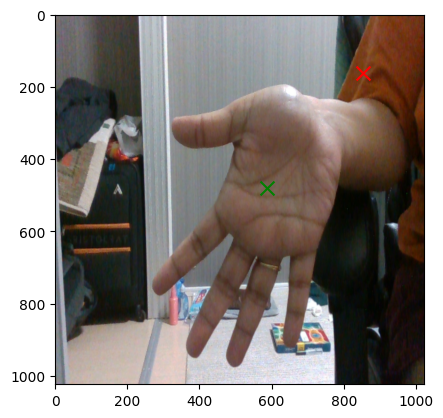

In [18]:
import matplotlib.pyplot as plt

from PIL import Image
image = Image.open('images/handme_Color.png')
image = np.array(image.convert("RGB"))

input_point = np.array([[300, 275], [100,400]])
input_label = np.array([1, 0])

t_img, t_coords, t_labels = prepare_inputs(image, input_point, input_label)

plt.imshow(image)
for i in range(input_point.shape[0]):
    y, x = input_point[i]
    label = input_label[i]
    color = 'g' if label == 1 else 'r'
    plt.scatter(x, y, c=color, s=100, marker='x')

plt.figure()

plt.imshow(t_img[0].permute(1, 2, 0).cpu().numpy().astype(np.uint8))
for i in range(t_coords.shape[1]):
    y, x = t_coords[0, i].cpu().numpy()
    label = t_labels[0, i].item()
    color = 'g' if label == 1 else 'r'
    plt.scatter(x, y, c=color, s=100, marker='x')

In [34]:
t_img[0].permute(1, 2, 0).shape

torch.Size([1024, 1024, 3])

In [35]:
enc_out = encoder.infer({"image": t_img})

# Extract features for Decoder
image_embed = enc_out["image_embed"]
high_res_0 = enc_out["high_res_feat_0"]
high_res_1 = enc_out["high_res_feat_1"]

decoder_inputs = {
    "image_embed": image_embed,
    "high_res_feat_0": high_res_0,
    "high_res_feat_1": high_res_1,
    "point_coords": t_coords,
    "point_labels": t_labels
}

In [36]:

print("-" * 60)
print(f"{'Engine': <25} | {'Latency': <9} | {'Throughput'}")
print("-" * 60)

benchmark("TensorRT Encoder", encoder.infer, {"image": dummy_img}, iterations=50)
benchmark("TensorRT Decoder", decoder.infer, decoder_inputs, iterations=200)
print("-" * 60)

------------------------------------------------------------
Engine                    | Latency   | Throughput
------------------------------------------------------------
TensorRT Encoder          |  31.40 ms |   31.8 FPS
TensorRT Decoder          |   1.39 ms |  721.4 FPS
------------------------------------------------------------


In [37]:
dec_out = decoder.infer(decoder_inputs)

In [43]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

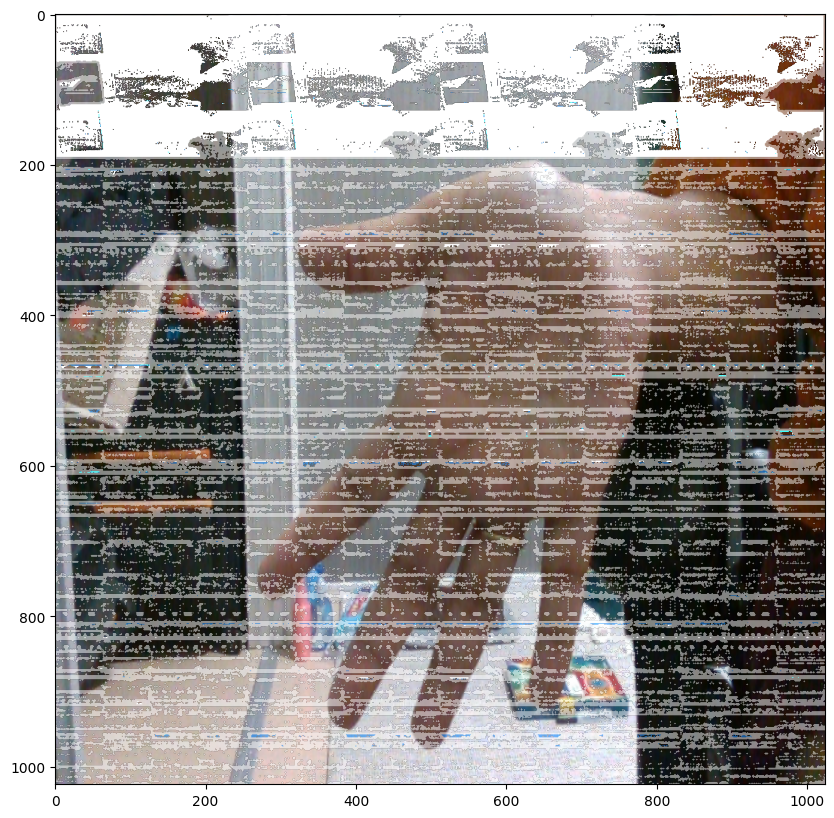

In [55]:
show_masks(t_img[0].permute(1, 2, 0).cpu().numpy().astype(np.uint8), dec_out['masks'][0].cpu().numpy(), dec_out['iou_predictions'].cpu().numpy(), point_coords=t_coords, input_labels=t_labels, borders=True)

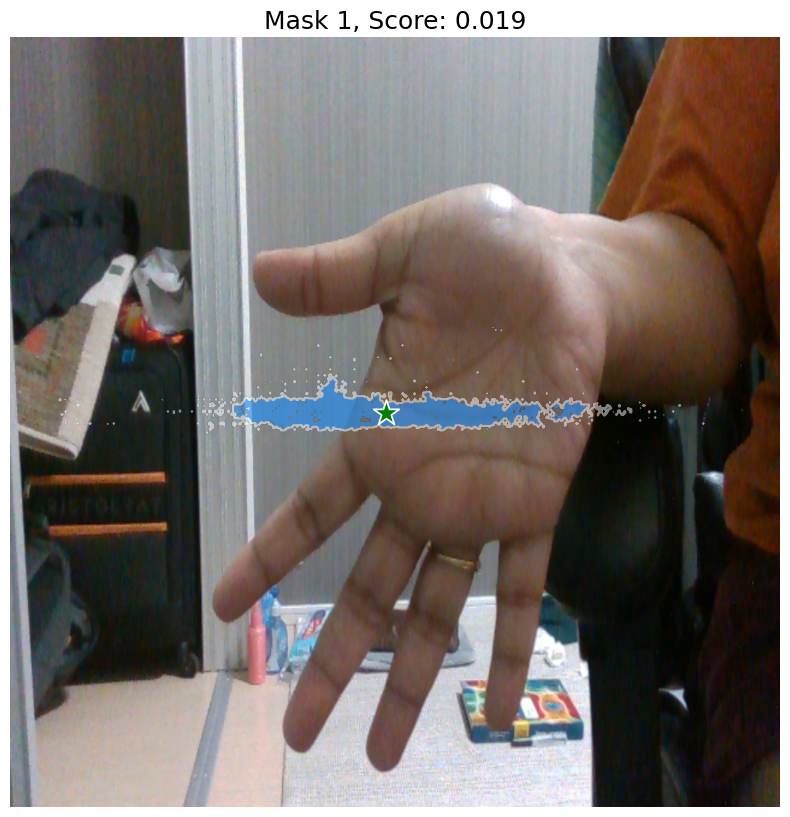

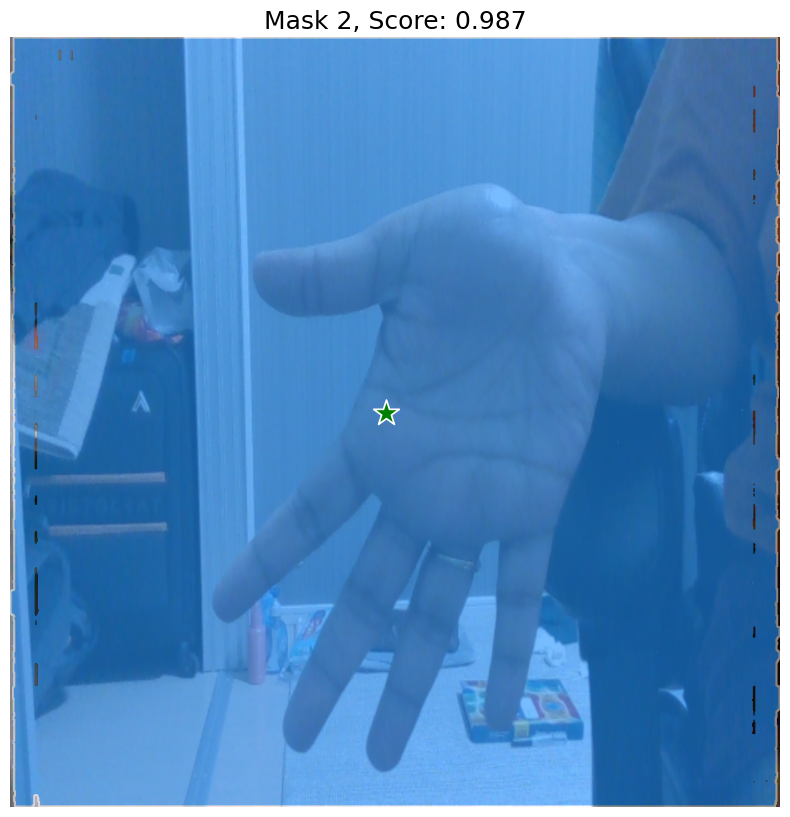

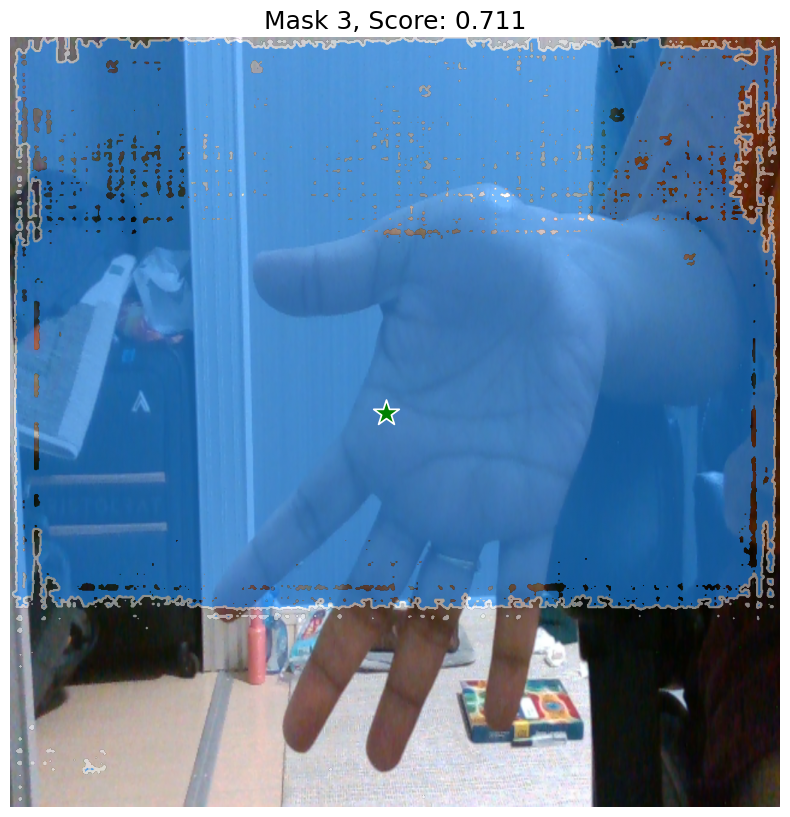

In [58]:
show_masks(t_img[0].permute(1, 2, 0).cpu().numpy().astype(np.uint8), torch_out[0], torch_out[1], point_coords=point_coords, input_labels=point_labels, borders=True)

In [61]:
t_coords.cpu().numpy(), t_labels.cpu().numpy().shape, input_point.shape, input_label.shape

(array([[[480.    , 586.6667],
         [160.    , 853.3334]]], dtype=float32),
 (1, 2),
 (2, 2),
 (2,))

In [112]:
sam2enc = EncoderWrapper(sam2_model)
img_features, high_res_0, high_res_1 = sam2enc(t_img)
sam2dec = DecoderWrapper(sam2_model)
# img_features, high_res_0, high_res_1 = sam2enc(dummy_img)
low_res_masks, iou_preds = sam2dec(img_features, high_res_0, high_res_1, t_coords, t_labels)
low_res_masks.shape, iou_preds.shape

(torch.Size([1, 3, 256, 256]), torch.Size([1, 3]))

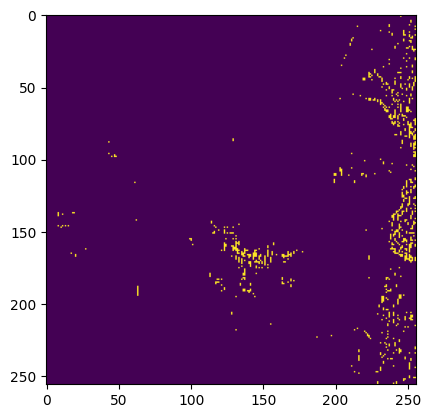

In [123]:
plt.imshow(low_res_masks[0,2].detach().cpu().numpy()>0.7)

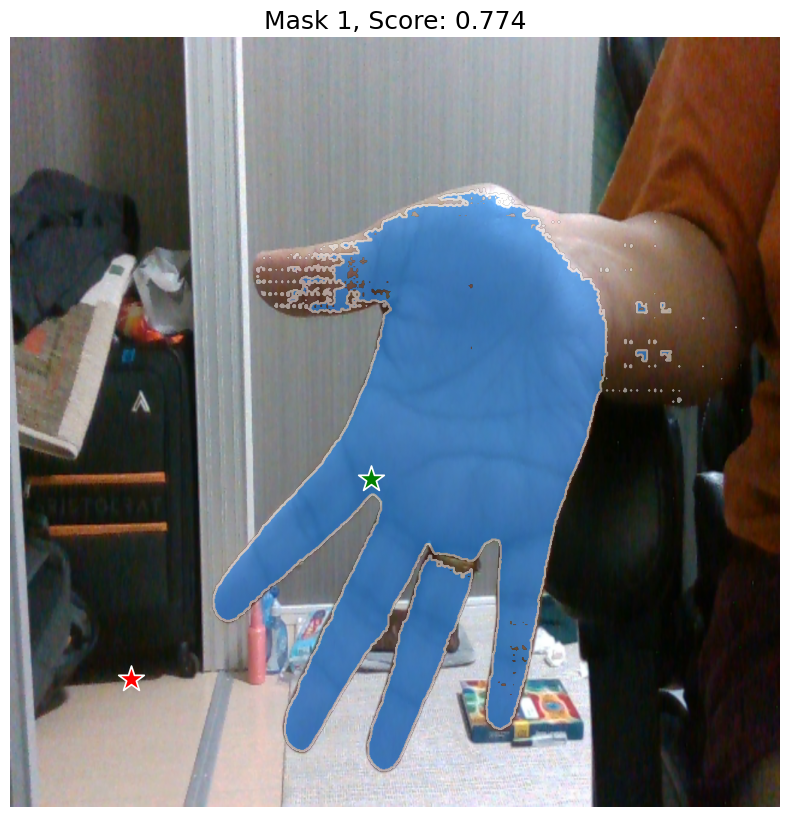

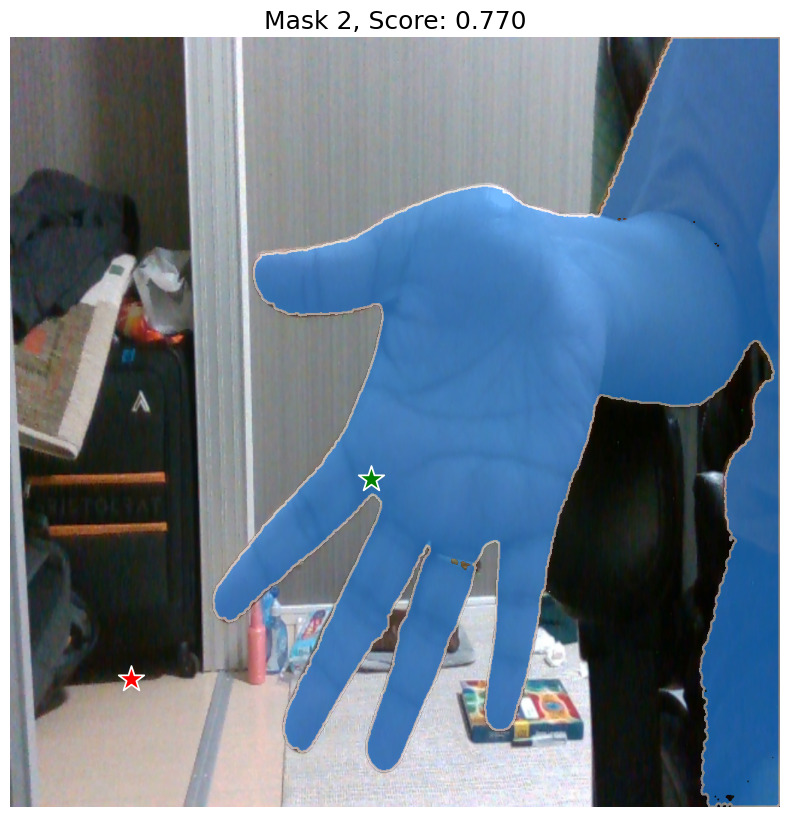

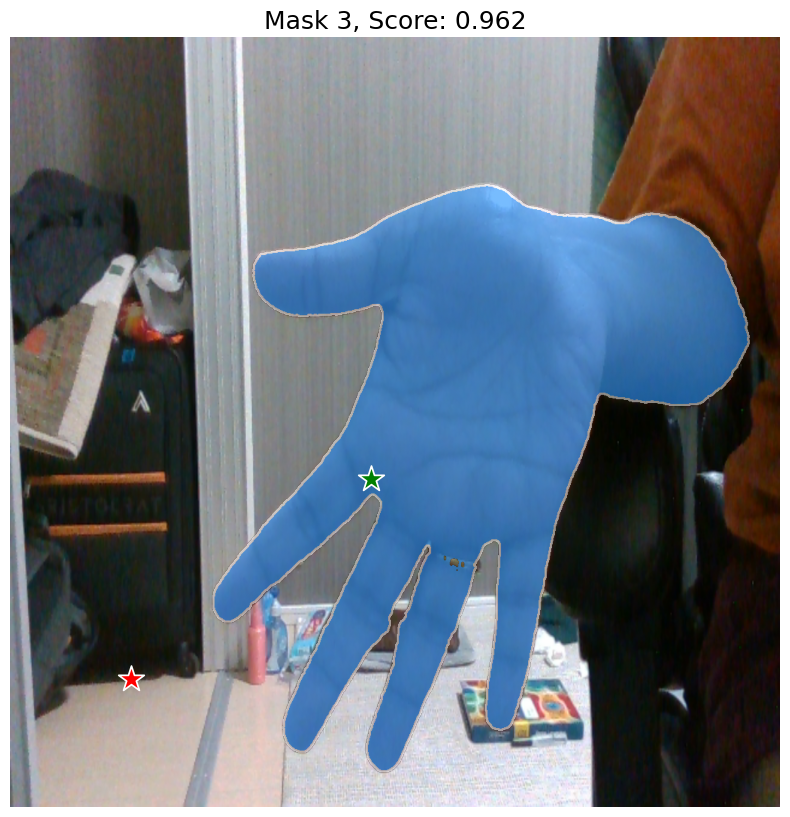

In [62]:
predictor.set_image(t_img[0].permute(1, 2, 0).cpu().numpy().astype(np.uint8))
masks, scores, logits = predictor.predict(
    point_coords=t_coords.cpu().numpy()[0],
    point_labels=t_labels.cpu().numpy()[0],
    multimask_output=True
)

show_masks(t_img[0].permute(1, 2, 0).cpu().numpy().astype(np.uint8), masks, scores, point_coords=t_coords.cpu().numpy()[0], input_labels=t_labels.cpu().numpy()[0], borders=True)

In [65]:
onnx_input_img.shape, point_coords.shape, point_labels.shape

((1, 3, 1024, 1024), (1, 1, 2), (1, 1))

In [95]:
onnx_input_img.shape, point_coords.shape, point_labels.shape, input_label.shape, input_point.shape

((1, 3, 1024, 1024), (1, 1, 2), (1, 1), (2,), (2, 2))

In [96]:
enc_outs = enc_sess.run(None, {"image": t_img.cpu().numpy()})


onnx_feats = {
    "image_embed": enc_outs[0],
    "high_res_feat_0": enc_outs[1],
    "high_res_feat_1": enc_outs[2],
    "point_coords": input_point[np.newaxis, :, :].astype(np.float32),
    "point_labels": input_label[np.newaxis, :].astype(np.float32)
    }

dec_outs = dec_sess.run(None, onnx_feats)

In [102]:
len(dec_outs), dec_outs[0].shape, dec_outs[1].shape

(2, (1, 3, 256, 256), (1, 3))